<a href="https://colab.research.google.com/github/satrio-hw/pattern_recognition_text_clustering/blob/main/pattern_recognition__text_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pattern Recognation Text Clustering

### Deskripsi Dataset

Dataset yang akan gunakan adalah artikel berita dari BBC yang telah dibuat dalam bentuk yang mudah diakses. Dataset ini terdiri dari 2225 dokumen dari situs berita BBC pada tahun 2004-2005 yang berasal dari lima topik: (business, entertainment, politics, sport, tech).

Untuk dataset aslinya dapat diakses di [sini](http://mlg.ucd.ie/datasets/bbc.html). Dataset ini dipublikasikan bersama dengan makalah berikut:

> D. Greene and P. Cunningham. "Practical Solutions to the Problem of Diagonal Dominance in Kernel Document Clustering", Proc. ICML 2006.<br><br>

---
The dataset originated from the news articles from the BBC which have been prepared in an easily accessible form. This dataset consists of 2225 documents from the BBC news in 2004-2005 covering five topics: (business, entertainment, politics, sport, tech). The original dataset can be accessed [here](http://mlg.ucd.ie/datasets/bbc.html). This dataset is published together with the following papers:

> D. Greene and P. Cunningham. "Practical Solutions to the Problem of Diagonal Dominance in Kernel Document Clustering", Proc. ICML 2006.<br><br>

### Modul and Dataset

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

%matplotlib inline

RANDOM_STATE = 1337
np.random.seed(RANDOM_STATE)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
plt.rcParams['figure.figsize'] = (12.0, 7.0)

In [ ]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.pipeline import make_pipeline

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
df = pd.read_csv('/content/gdrive/My Drive/dataset/pengenalan_pola/bbc.csv')
df.head()

,text,y
0,Muslim group attacks TV drama 24\r\n\r\nA Brit...,entertainment
1,How the Academy Awards flourished\r\n\r\nThe 7...,entertainment
2,Global release for Japan hit film\r\n\r\nOscar...,entertainment
3,Howl helps boost Japan's cinemas\r\n\r\nJapan'...,entertainment
4,South Bank Awards honour hit soap\r\n\r\nCoron...,entertainment


In [ ]:
X = df['text']
y = df['y'].astype('category')

## **1. Eksplorasi Awal Data**
_**Initial Data Exploration**_

### **Analisis stop_words dalam text**
_**Stop words analysis in given text**_<br><br>

Stop words disebut juga sebagai kata-kata yang memiliki frekuensi kemunculan yang tinggi dalam sebuah text, meski tidak memiliki makna yang signifikan. Dalam analisis yang akan dilakukan, perlu dilakukan _preprocessing_, yang mana didalamnya terdapat langkah menghilangkan _Stop words_.
<br><br>
Untuk melihat lebih jelas, saya akan menampilkan 25 kata dengan frekuensi kemunculan tertinggi sebelum dan sesudah stop words dihilangkan.

---
_Stop words are also known as words that have a high frequency of appearance in a text, even though they do not have a significant meaning. In this text analysis, preprocessing is mandatory, in which there is a step to eliminate Stop words._<br><br>

_For a better understanding, I will display 25 words with the highest frequency before and after the stop words removal._

##### Cleaning

In [ ]:
!pip install sastrawi
import nltk
from sklearn.feature_extraction import text 
nltk.download('punkt')
nltk.download('stopwords')
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
import re
import string

     |████████████████████████████████| 215kB 7.7MB/s 
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
rawtext=[]
for i in range(len(X)):
    rawtext.append(X[i])
rawtext[0]

'Muslim group attacks TV drama 24\r\n\r\nA British Muslim group has criticised the new series of US drama 24, which is about to be aired on Sky One, claiming it portrays Islam unfairly.\r\n\r\nThe Muslim Council of Britain has complained to broadcasting watchdog Ofcom. It says the programme breaches editorial guidelines. The group\'s members met with Sky executives on Tuesday after viewing previews of the first five episodes. The drama, now in its fourth series, begins on Sunday evening. The new series portrays a Muslim family as a sleeper terrorist cell. The Muslim Council of Britain said in a statement: "We are greatly concerned by the unremittingly hostile and unbalanced portrayal of Muslims in this series of 24 based upon a preview of the first five episodes that we have seen." "There is not a single positive Muslim character in the storyline to date. At a time when negative stereotypes of Muslims are on the increase we feel that Sky - as a major UK broadcaster - has a responsibili

In [ ]:
factory = StemmerFactory()
stemmer = factory.create_stemmer()

cleantext = []
for i in range(len(rawtext)):
    textcontent=rawtext[i]
    #print('BEFORE : \n')
    #display(textcontent)

    textcontent=textcontent.strip('\n') #remove trailing newline
    textcontent=textcontent.replace("\'s","") #remove posessive form
    textcontent=textcontent.replace('\r\n\r\n',' ') #remove \r\n\n
    textcontent=textcontent.replace("\r","") #remove \r at the end of paragraph
    textcontent = re.sub(r"\d+", "", textcontent) #remove number

    textcontent = textcontent.translate(str.maketrans(' ',' ',string.punctuation)).lower() #remove symbols
    cleantext.append(textcontent)
    #print('AFTER : \n')
    #display(textcontent)
newdf = pd.DataFrame({'text':cleantext, 'y':y})
newdf

,text,y
0,muslim group attacks tv drama a british musli...,entertainment
1,how the academy awards flourished the th annua...,entertainment
2,global release for japan hit film oscarwinning...,entertainment
3,howl helps boost japan cinemas japan box offic...,entertainment
4,south bank awards honour hit soap coronation s...,entertainment
...,...,...
2220,labour pig poster antisemitic the labour party...,politics
2221,peace demo appeal rejected peace protestors ha...,politics
2222,the memory driving brown mission the memory go...,politics
2223,tory expert denies defeatism the conservatives...,politics


In [ ]:
newdf['text'][1:3]

1    how the academy awards flourished the th annua...
2    global release for japan hit film oscarwinning...
Name: text, dtype: object

#### Before removal

In [ ]:
vect = CountVectorizer(stop_words=None)
matrix = vect.fit_transform(newdf['text'])

sum_words = matrix.sum(axis=0) 
words_freq = [(word, sum_words[0, idx]) for word, idx in vect.vocabulary_.items()]
words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
display(words_freq[0:25])

[('the', 52603),
 ('to', 25002),
 ('of', 19966),
 ('and', 18574),
 ('in', 17633),
 ('for', 8918),
 ('is', 8554),
 ('that', 8254),
 ('it', 7877),
 ('on', 7537),
 ('said', 7252),
 ('was', 6028),
 ('he', 5916),
 ('be', 5800),
 ('with', 5343),
 ('as', 4982),
 ('has', 4955),
 ('have', 4750),
 ('at', 4618),
 ('by', 4492),
 ('will', 4472),
 ('but', 4421),
 ('are', 4400),
 ('from', 3534),
 ('not', 3476)]

#### After removal

##### For all Categories/Topics

In [ ]:
listStopword =  set(nltk.corpus.stopwords.words('english'))
stop_words = text.ENGLISH_STOP_WORDS.union(listStopword)

vect = CountVectorizer(stop_words=stop_words)
matrix = vect.fit_transform(newdf['text'])

sum_words = matrix.sum(axis=0) 
words_freq = [(word, sum_words[0, idx]) for word, idx in vect.vocabulary_.items()]
words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
display(words_freq[0:25])

[('said', 7252),
 ('mr', 3004),
 ('people', 2043),
 ('new', 1970),
 ('year', 1859),
 ('world', 1186),
 ('government', 1153),
 ('time', 1147),
 ('uk', 1078),
 ('years', 1001),
 ('bn', 947),
 ('make', 927),
 ('best', 926),
 ('told', 911),
 ('game', 859),
 ('film', 855),
 ('like', 838),
 ('music', 835),
 ('labour', 796),
 ('bbc', 776),
 ('number', 760),
 ('added', 731),
 ('way', 726),
 ('set', 712),
 ('says', 687)]

##### For each Category/Topic

In [ ]:
bylabel = newdf.groupby('y')    

for label in bylabel.groups:

  print('\n\n By '+label+' :')
  display(bylabel.get_group(label))

  listStopword =  set(nltk.corpus.stopwords.words('english'))
  stop_words = text.ENGLISH_STOP_WORDS.union(listStopword)

  vect = CountVectorizer(stop_words=stop_words)
  matrix = vect.fit_transform(bylabel.get_group(label)['text'])

  sum_words = matrix.sum(axis=0) 
  words_freq = [(word, sum_words[0, idx]) for word, idx in vect.vocabulary_.items()]
  words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
  display(words_freq[0:25])



 By business :


,text,y
1298,gold falls on imf sale concerns the price of g...,business
1299,yukos unit fetches bn at auction a littleknown...,business
1300,worldcom boss left books alone former worldcom...,business
1301,police detain chinese milk bosses chinese poli...,business
1302,sec to rethink postenron rules the us stock ma...,business
...,...,...
1803,tsunami to hit sri lanka banks sri lanka banks...,business
1804,russian oil merger excludes yukos the merger o...,business
1805,google shares fall as staff sell shares in goo...,business
1806,mg rover china tieup delayed mg rover proposed...,business


[('said', 1680),
 ('bn', 774),
 ('year', 647),
 ('mr', 600),
 ('market', 425),
 ('new', 416),
 ('company', 415),
 ('growth', 384),
 ('firm', 362),
 ('economy', 359),
 ('government', 340),
 ('bank', 335),
 ('sales', 316),
 ('economic', 310),
 ('oil', 294),
 ('shares', 265),
 ('world', 252),
 ('years', 247),
 ('prices', 246),
 ('chief', 236),
 ('china', 223),
 ('business', 218),
 ('companies', 212),
 ('analysts', 209),
 ('uk', 207)]



 By entertainment :


,text,y
0,muslim group attacks tv drama a british musli...,entertainment
1,how the academy awards flourished the th annua...,entertainment
2,global release for japan hit film oscarwinning...,entertainment
3,howl helps boost japan cinemas japan box offic...,entertainment
4,south bank awards honour hit soap coronation s...,entertainment
...,...,...
381,joy division story to become film the life of ...,entertainment
382,franz man seeks government help franz ferdinan...,entertainment
383,tv presenter deeley drops cduk cat deeley has ...,entertainment
384,little britain two top comic list little brita...,entertainment


[('said', 825),
 ('film', 753),
 ('best', 590),
 ('music', 435),
 ('year', 378),
 ('new', 322),
 ('awards', 273),
 ('award', 233),
 ('uk', 228),
 ('number', 227),
 ('years', 226),
 ('band', 215),
 ('tv', 209),
 ('director', 209),
 ('people', 205),
 ('star', 203),
 ('actor', 201),
 ('mr', 194),
 ('british', 190),
 ('films', 188),
 ('album', 188),
 ('bbc', 186),
 ('time', 167),
 ('including', 164),
 ('song', 164)]



 By politics :


,text,y
1808,thousands join strike in wales thousands of ci...,politics
1809,blair to face trust issue head on tony blair s...,politics
1810,howard unveils tory asylum plans tory plans to...,politics
1811,lib dems highlight problem debt people vulnera...,politics
1812,new rules tackle ham weddings new rules on mar...,politics
...,...,...
2220,labour pig poster antisemitic the labour party...,politics
2221,peace demo appeal rejected peace protestors ha...,politics
2222,the memory driving brown mission the memory go...,politics
2223,tory expert denies defeatism the conservatives...,politics


[('said', 2239),
 ('mr', 1686),
 ('labour', 760),
 ('government', 729),
 ('people', 623),
 ('blair', 572),
 ('party', 567),
 ('election', 565),
 ('minister', 432),
 ('new', 430),
 ('brown', 384),
 ('told', 359),
 ('uk', 340),
 ('public', 322),
 ('howard', 319),
 ('plans', 311),
 ('prime', 283),
 ('say', 272),
 ('tory', 267),
 ('secretary', 266),
 ('britain', 263),
 ('tax', 263),
 ('bbc', 253),
 ('chancellor', 249),
 ('leader', 249)]



 By sport :


,text,y
787,tevez an argentine in brazil some years ago ...,sport
788,odriscoll saves irish blushes two moments of m...,sport
789,gb quartet get cross country call four british...,sport
790,moody joins up with england lewis moody has fl...,sport
791,zambia confident and cautious zambia technical...,sport
...,...,...
1293,houllier praises benitez regime former liverpo...,sport
1294,newry to fight cup exit in courts newry city a...,sport
1295,gerrard happy at anfield liverpool captain ste...,sport
1296,can smith work scottish wonders the worst kept...,sport


[('said', 941),
 ('game', 478),
 ('england', 459),
 ('win', 415),
 ('world', 379),
 ('time', 327),
 ('players', 307),
 ('play', 292),
 ('cup', 290),
 ('new', 285),
 ('ireland', 270),
 ('year', 269),
 ('team', 265),
 ('wales', 265),
 ('good', 258),
 ('club', 254),
 ('second', 249),
 ('match', 247),
 ('coach', 228),
 ('set', 228),
 ('final', 228),
 ('france', 227),
 ('season', 223),
 ('rugby', 210),
 ('injury', 208)]



 By tech :


,text,y
386,toxic web links help virus spread virus writer...,tech
387,junk emails on relentless rise spam traffic is...,tech
388,net regulation till possible the blurring of b...,tech
389,looks and music to drive mobiles mobile phones...,tech
390,europe backs digital tv lifestyle how people r...,tech
...,...,...
782,more power to the people says hp the digital r...,tech
783,seamen sail into biometric future the luxury c...,tech
784,world tour for top video gamers two uk gamers ...,tech
785,lifestyle governs mobile choice faster better ...,tech


[('said', 1567),
 ('people', 960),
 ('new', 517),
 ('mr', 509),
 ('technology', 504),
 ('mobile', 467),
 ('users', 407),
 ('games', 400),
 ('music', 384),
 ('use', 379),
 ('digital', 373),
 ('software', 372),
 ('net', 354),
 ('year', 338),
 ('like', 326),
 ('game', 320),
 ('make', 317),
 ('phone', 316),
 ('online', 308),
 ('computer', 301),
 ('world', 297),
 ('uk', 285),
 ('time', 283),
 ('used', 281),
 ('service', 279)]

## **2. Clustering dengan k-Means**
_**Clustering using k-Means approach**_

### **Data Visualisation**

Untuk proses visualisasi yang lebih baik, text dokumen akan direpresentasikan dalam bentuk vektor sebagaimana layaknya dalam Bag-of-Words. Saya menggunakan _**TfidfVectorizer**_ agar stop words dibobotkan lebih kecil pada vektor yang nantinya akan dihasilkan. Penggunaan _**TfidfVectorizer**_ berdampak pada dimensi vektor yang amat besar (mengingat tiap katanya merepresentasikan satu dimensi). Untuk mengurangi dimensi, saya menggunakan modul _**TruncatedSVD**_.<br><br>

---
_For a better visualization process, the document will be represented in vector form similar to Bag-of-Words. I use **TfidfVectorizer** so that the stop words are less weighted on the vector. The vector generated by **TfidfVectorizer** has massive dimensions (considering that each word represents one dimension). To reduce dimensions, I use the **TruncatedSVD** module._

Pada visualisasi yang pertama, vektorisasi dan dimension reduction dilakukan untuk __semua data points, kemudian di plot menurut labelnya masing-masing :__<br><br>

---
_In the first visualization, vectorization and dimension reduction were carried out for **all data points, then plotted according to their respective labels**:_

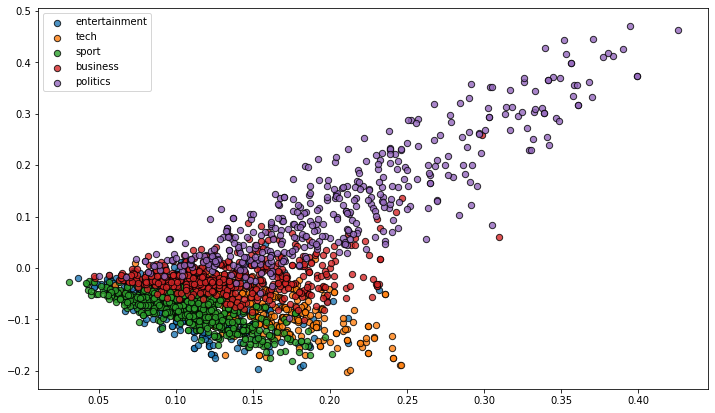

In [ ]:
listStopword =  set(nltk.corpus.stopwords.words('english'))
stop_words = text.ENGLISH_STOP_WORDS.union(listStopword)

vect = TfidfVectorizer(stop_words=stop_words)
matrix = vect.fit_transform(newdf['text'])

svd = TruncatedSVD(n_components=2)
truncated_matrix1 = svd.fit_transform(matrix)

start=[]
end=[]
labels=[]
start.append(0)
for i in range(1,len(newdf)):
  if (newdf['y'][i] != newdf['y'][i-1]):
    start.append(i)
    labels.append(newdf['y'][i-1])
    end.append(i-1)
labels.append(newdf['y'][i])
end.append(i)
# print(start)
# print(end)
# print(labels)

i=0
for label in labels:
  vect_plot1=plt.scatter(truncated_matrix1[start[i]:(end[i]+1), 0], truncated_matrix1[start[i]:(end[i]+1), 1], s=40, alpha=0.8, edgecolors='black', label=label)
  i+=1

plt.legend()
display(vect_plot1)

Pada visualisasi kedua, __data points akan dibagi menurut kelasnya baru kemudian dilakukan vektorisasi dan dimension reduction__.<br><br>

---
_In the second visualization, **the data points will be divided according to the class at first, then vectorization and dimension reduction are carried out.**_

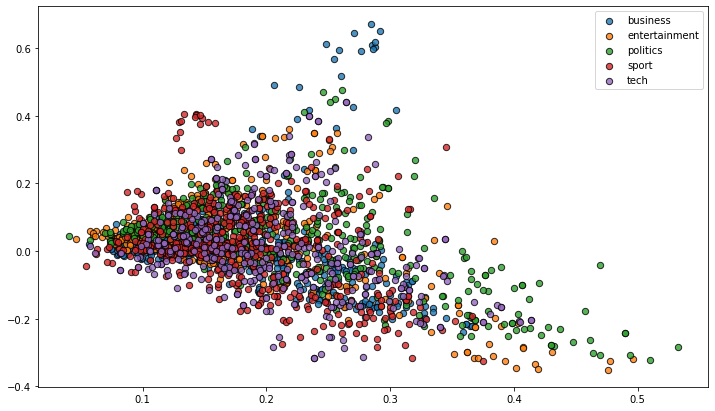

In [ ]:
bylabel = newdf.groupby('y')  
listStopword =  set(nltk.corpus.stopwords.words('english'))
stop_words = text.ENGLISH_STOP_WORDS.union(listStopword)

for label in bylabel.groups:
  vect = TfidfVectorizer(stop_words=stop_words)
  matrix = vect.fit_transform(bylabel.get_group(label)['text'])

  svd = TruncatedSVD(n_components=2)
  truncated_matrix = svd.fit_transform(matrix)
  vect_plot2 = plt.scatter(truncated_matrix[:, 0],truncated_matrix[:, 1], s=40, alpha=0.8, edgecolors='black', label=label)

plt.legend()
display(vect_plot2)

Gambar yang dihasilkan berbeda dikarenakan pada proses vektorisasi yang pertama, tiap kata yang sama akan dihitung dari __seluruh dokumen (meski beda kelas)__ yang ada, sementara pada proses yang kedua, tiap kata hanya diperhitungkan berdasarkan __dokumen dengan kelas/topik yang sama saja__.<br><br>

---
_The difference between the two images was because, the same word will be counted **across all existing documents in the first vectorization process** (even though different classes), while in the second process, the words were only calculated **for the documents with the same class/topic.**_

### **Even Better Data Viz**

Cara lain yang dapat diimplementasikan untuk mengurangi dimensi yang besar, yaitu dengan mengimplementasikan **TSNE**. Sama seperti sebelumnya, reduksi dilakukan pada hasil vektorisasi **TfidVectorizer**, hanya saja tidak langsung menjadi 2 dimensi, melainkan 100 dimensi dengan **TruncatedSVD**. Dari 100 dimensi yang ada kemudian akan direduksi kembali menjadi 2 dimensi dengan **TSNE**.<br><br>

---
_Another way that can be implemented to reduce large dimensions is by implementing **TSNE**. Just like before, the reduction is carried out on the vectorized data using **TfidVectorizer**. Rather than reduce the dimension directly into 2 dimensions, dimensions will reduce to 100 using **TruncatedSVD**. The existing 100 dimensions will then be reduced again to 2 dimensions using **TSNE** for visualization._

https://medium.com/@garora039/dimensionality-reduction-using-t-sne-effectively-cabb2cd519b

https://distill.pub/2016/misread-tsne/

__Fitting TruncatedSVD dilakukan tiap kali perplexity value diubah__

---
_**Fitting TruncatedSVD done for every shift in perplexity value**_ 
<br>
Hyperparameter perplexity = 5-50 dan n_iter = 20000*

In [ ]:
from sklearn.manifold import TSNE

idx=1
tsne_reduction_innertruncated = []

for perplexity_p in range (2,51) :
  listStopword =  set(nltk.corpus.stopwords.words('english'))
  stop_words = text.ENGLISH_STOP_WORDS.union(listStopword)

  pipe = make_pipeline(TfidfVectorizer(stop_words=stop_words), TruncatedSVD(n_components=100), TSNE(n_components=2, random_state=42, perplexity=perplexity_p, n_iter=20000))

  tsne_reduction_pipe = pipe.fit_transform(newdf['text'])

  # EXPORT to CSV
  # pd.set_option('display.max_rows', 15)
  export_csv = pd.DataFrame({'x':tsne_reduction_pipe[:, 0], 'y':tsne_reduction_pipe[:, 1]})
  path='/content/gdrive/My Drive/dataset/pengenalan_pola/tugas4/tsne_reduction_innertruncated-p'+str(perplexity_p)+'.csv'
  export_csv.to_csv(path)

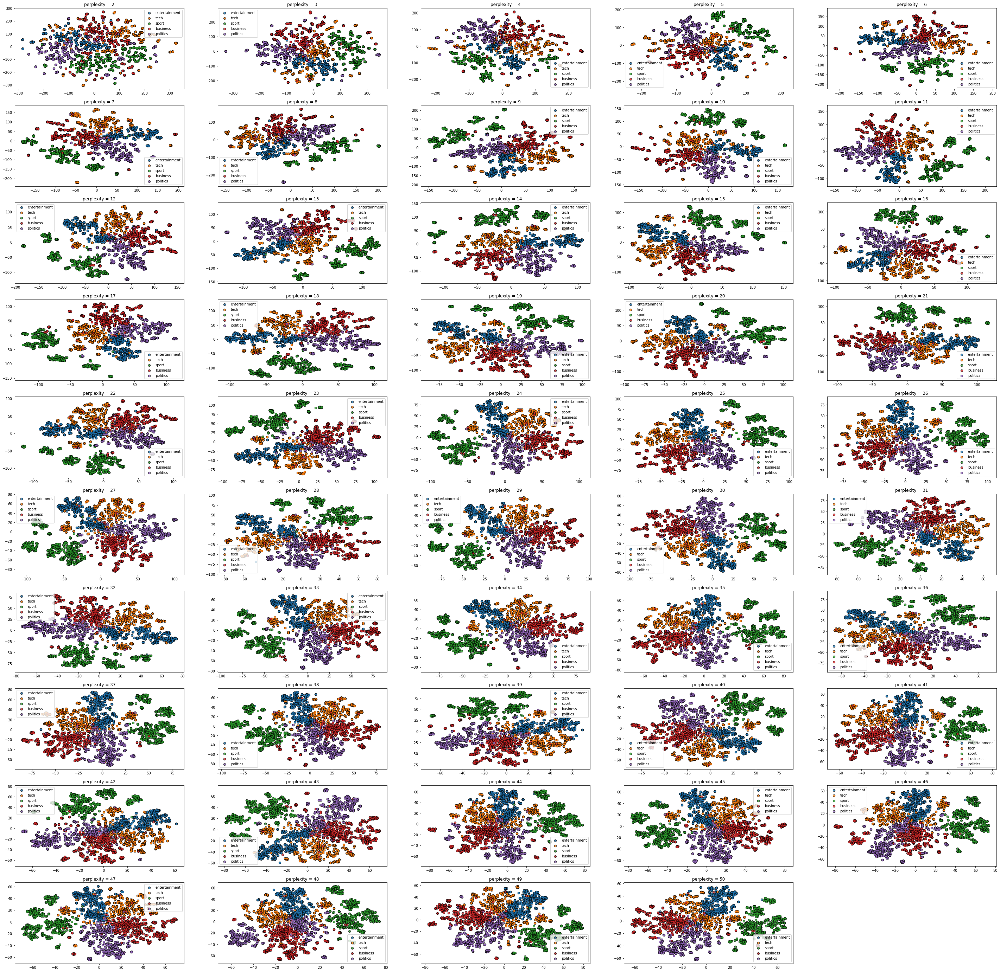

In [ ]:
idx=1
plt.figure(figsize=(50,50))
for perplexity_p in range (2,51) :
  path='/content/gdrive/My Drive/dataset/pengenalan_pola/tugas4/tsne_reduction_innertruncated-p'+str(perplexity_p)+'.csv'
  plot_tsne_reduction_innertruncated = pd.read_csv(path, index_col=0)
  
  # PLOT START
  i=0
  plt.subplot(10,5,idx)
  for label in labels:
    tsne_vect_plot=plt.scatter(plot_tsne_reduction_innertruncated.iloc[start[i]:end[i], 0], plot_tsne_reduction_innertruncated.iloc[start[i]:end[i], 1], s=40, alpha=0.8, edgecolors='black', label=label)
    i+=1

  plt.title('perplexity = '+str(perplexity_p))
  plt.legend(loc='best')

  idx+=1

__TruncatedSVD dilakukan sekali untuk semua data__ sebelum nilai perplexity diubah.<br>

---
*__TruncatedSVD done once for all data__ before the shift of perplexity value.*
<br>
Hyperparameter perplexity = 5-50 dan n_iter = 20000*

In [ ]:
from sklearn.manifold import TSNE

listStopword =  set(nltk.corpus.stopwords.words('english'))
stop_words = text.ENGLISH_STOP_WORDS.union(listStopword)

vect = TfidfVectorizer(stop_words=stop_words)
matrix = vect.fit_transform(newdf['text'])

svd_n100 = TruncatedSVD(n_components=100)
truncated_matrix_n100 = svd_n100.fit_transform(matrix)

tsne_reduction_outertruncated = []
plt.figure(figsize=(50,50))
idx=1

for perplexity_p in range (2,51) :
  tsne_reduction = TSNE(n_components=2, random_state=42, perplexity=perplexity_p, n_iter=20000).fit_transform(truncated_matrix_n100)
  tsne_reduction_outertruncated.append(tsne_reduction)

  # EXPORT to CSV
  export_csv = pd.DataFrame({'x':tsne_reduction[:, 0], 'y':tsne_reduction[:, 1]})
  path='/content/gdrive/My Drive/dataset/pengenalan_pola/tugas4/tsne_reduction_outertruncated-p'+str(perplexity_p)+'.csv'
  export_csv.to_csv(path)

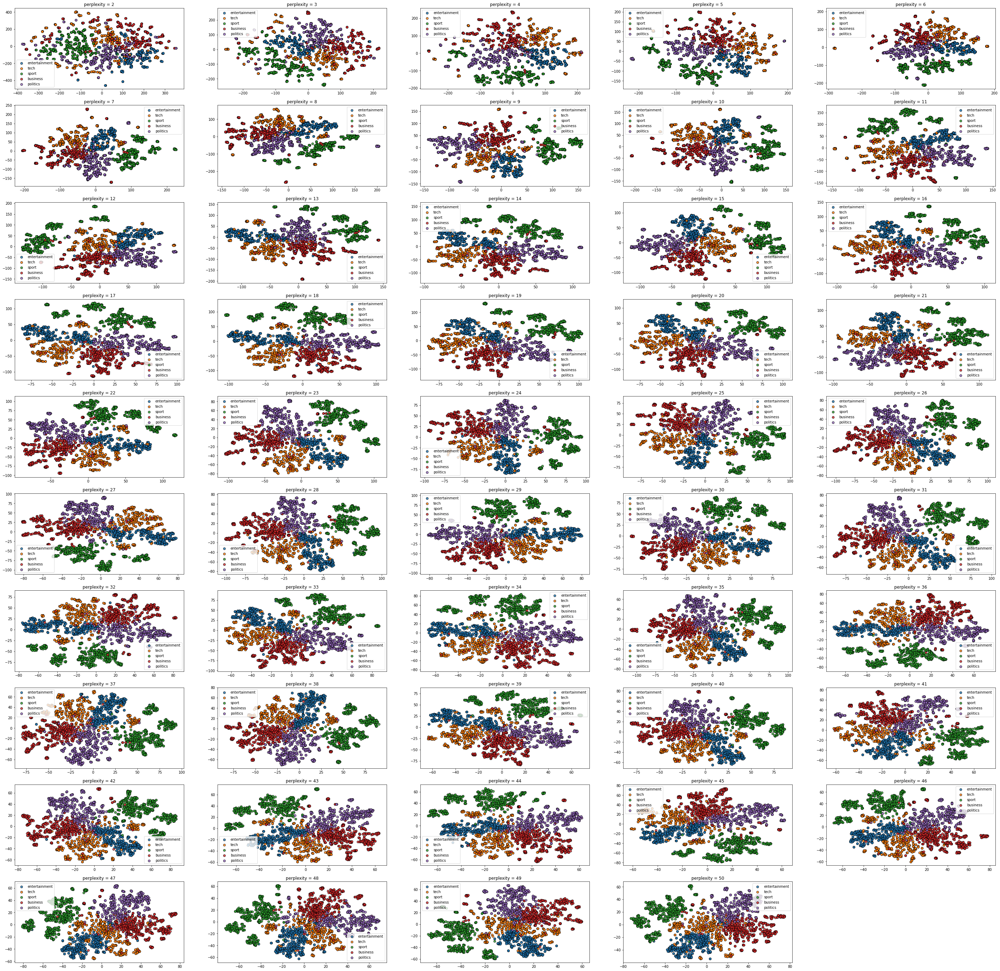

In [ ]:
idx=1
plt.figure(figsize=(50,50))
for perplexity_p in range (2,51) :
  path='/content/gdrive/My Drive/dataset/pengenalan_pola/tugas4/tsne_reduction_outertruncated-p'+str(perplexity_p)+'.csv'
  plot_tsne_reduction_outertruncated = pd.read_csv(path, index_col=0)

  # PLOT START
  i=0
  plt.subplot(10,5,idx)
  for label in labels:
    tsne_vect_plot=plt.scatter(plot_tsne_reduction_outertruncated.iloc[start[i]:end[i], 0], plot_tsne_reduction_outertruncated.iloc[start[i]:end[i], 1], s=40, alpha=0.8, edgecolors='black', label=label)
    i+=1

  plt.title('perplexity = '+str(perplexity_p))
  plt.legend(loc='best')

  idx+=1

### **K-Means**

Untuk melakukan Clustering menggunakan K-means, perlu diketahui jumlah $k$ yang sesuai. Saya menggunakan **.inertia** dari **KMeans** untuk menemukan nilai $k$ yang sesuai. Saya akan mencoba nilai $k \in [2,10]$ untuk menemukan nilai inertia yang optimal.<br><br>

---
_To perform clustering using K-means, it is necessary to know the appropriate value of $k$. I used **.inertia** from **KMeans** to find the most suitable $k$ value. I will try the value of $k \in [2,10]$ to find the optimal inertia._

*Hyperparameter TSNE __{perplexity : 30, n_iter = 20000}__:*

Text(0.5, 1.0, 'Original Data and Class')

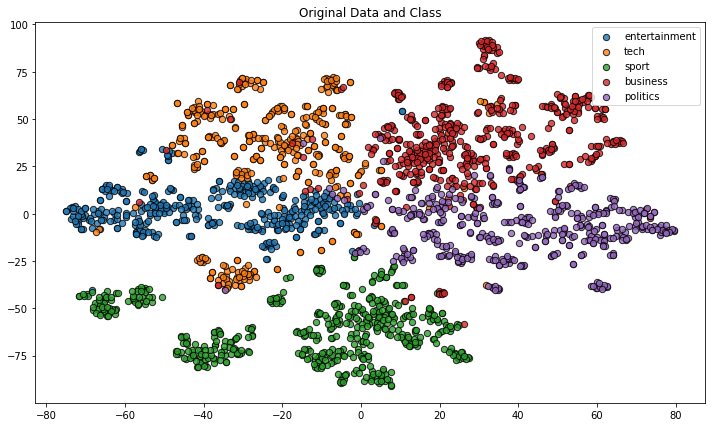

In [ ]:
from sklearn.manifold import TSNE

listStopword =  set(nltk.corpus.stopwords.words('english'))
stop_words = text.ENGLISH_STOP_WORDS.union(listStopword)

pipe = make_pipeline(TfidfVectorizer(stop_words=stop_words), TruncatedSVD(n_components=100), TSNE(n_components=2, random_state=42, perplexity=30, n_iter=20000))

tsne_reduction_p30_iter20000 = pipe.fit_transform(newdf['text'])
kmeans_inertia =[]
K = range(2,22)
for k in K:
  kmeans = KMeans(n_clusters=k, random_state=13).fit(tsne_reduction_p30_iter20000)
  kmeans_inertia.append(kmeans.inertia_)

i=0
for label in labels:
    tsne_vect_plot=plt.scatter(tsne_reduction_p30_iter20000[start[i]:(end[i]+1), 0], tsne_reduction_p30_iter20000[start[i]:(end[i]+1), 1], s=40, alpha=0.8, edgecolors='black', label=label)
    i+=1
plt.legend(loc='best')
plt.title('Original Data and Class')

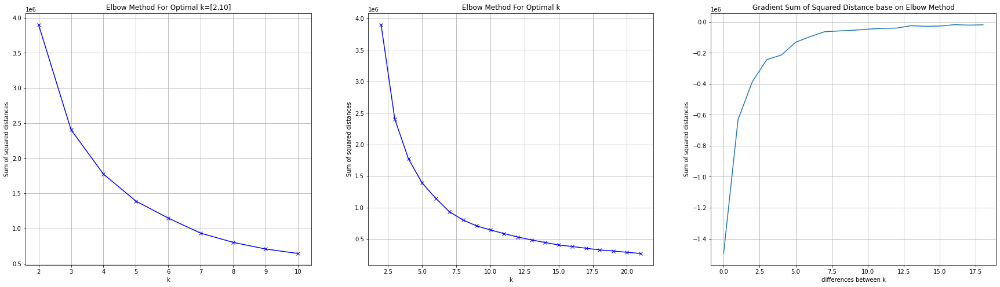

In [ ]:
plt.figure(figsize=(30,8))

plt.subplot(1,3,1)
from2to10_inertia = plt.plot(np.arange(2,11), kmeans_inertia[:9], 'bx-')
plt.grid()
plt.xlabel('k')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k=[2,10]')

plt.subplot(1,3,2)
plt.plot(K, kmeans_inertia, 'bx-')
plt.grid()
plt.xlabel('k')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')

plt.subplot(1,3,3)
gradient_bet_k=[]
for i in range(len(kmeans_inertia)-1):
  gradient_bet_k.append(kmeans_inertia[i+1]-kmeans_inertia[i])
plt.plot(np.arange(0,len(gradient_bet_k)),gradient_bet_k)
plt.xlabel('differences between k')
plt.ylabel('Sum of squared distances')
plt.yscale('linear')
plt.title('Gradient Sum of Squared Distance base on Elbow Method')
plt.grid()

plt.show()

Secara intuisi visual, nilai $k$ terbaik dengan Hyperparameter dan data diatas antara __5-7__<br>
Bisa dilihat dari selisih berubahan antar nilai $k$ mulai landai dan cenderung stabil sejak __$k$ >= 5__<br><br>

---
_Visually, the best $k$ value with Hyperparameter and above data between 5-7. It can be seen from the difference in changes between the $k$ values starting to slope and tends to be stable since $k$ >= 5_

#### _**Visualization of each Cluster with centroid**_

In [ ]:
kmeans = KMeans(n_clusters=5, random_state=13).fit(tsne_reduction_p30_iter20000)
y_kmeans = kmeans.predict(tsne_reduction_p30_iter20000)

No handles with labels found to put in legend.


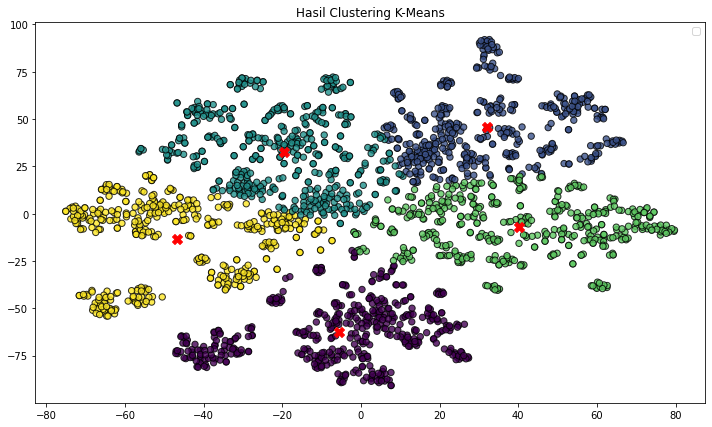

In [ ]:
plt.scatter(tsne_reduction_p30_iter20000[:, 0], tsne_reduction_p30_iter20000[:, 1], c=y_kmeans, s=40, alpha=0.8, edgecolors='black')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=100, marker="X")

plt.title("Hasil Clustering K-Means")
plt.legend(loc='best')
plt.show()

## **3. Clustering dengan Gaussian Mixture Models**
_**Clustering using Gaussian Mixture Models (GMM)**_

Clustering menggunakan GMM diawali dengna mencari nilai $k$ yang sesuai. Untuk menemukan nilai $k$, GMM menggunakan plot **AIC** dan **BIC**. Criterion ini memberikan "pinalti" terhadap model agar terhindar dari overfitting sekaligus dalam kasus ini, memberikan gambaran umum mengenai nilai $k$ yang optimal pada implementasi GMM. Nilai optimal yang dicari adalah nilai terendah dari kedua Criterion tersebut<br><br>

---
_Clustering using GMM begins by finding the appropriate $k$ value. To find the $k$ value, GMM uses the **AIC** and **BIC** plots. This criterion gives the model a "penalty" to avoid overfitting and for this case, providing an overview of the optimal $k$ value for a GMM implementation. The optimal value sought is the lowest value of the two Criterion_

https://jakevdp.github.io/PythonDataScienceHandbook/05.12-gaussian-mixtures.html <br>
https://towardsdatascience.com/gaussian-mixture-model-clusterization-how-to-select-the-number-of-components-clusters-553bef45f6e4

In [ ]:
GMM = GaussianMixture

#### *__AIC and BIC in GMM: $k \in [2,10]$ without T-SNE dimensions reduction:__*

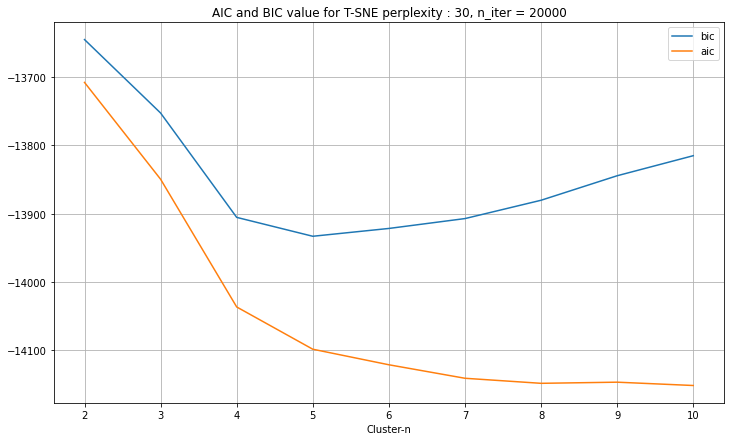

In [ ]:
n_components = np.arange(2, 11)

models = [GMM(n, covariance_type='full', random_state=13, max_iter=1000).fit(truncated_matrix1) for n in n_components]

p30_iter20000=plt.plot(n_components, [m.bic(truncated_matrix1) for m in models], label='bic')
p30_iter20000=plt.plot(n_components, [m.aic(truncated_matrix1) for m in models], label='aic')

plt.legend(loc='best')
plt.xlabel('Cluster-n');
plt.title('AIC and BIC value for T-SNE perplexity : 30, n_iter = 20000')
plt.grid()
plt.show()

*Optimal in $k=5$*

#### *__AIC and BIC in GMM: $k \in [2,80]$ with T-SNE perplexity=30 dan n_iter=20000__*

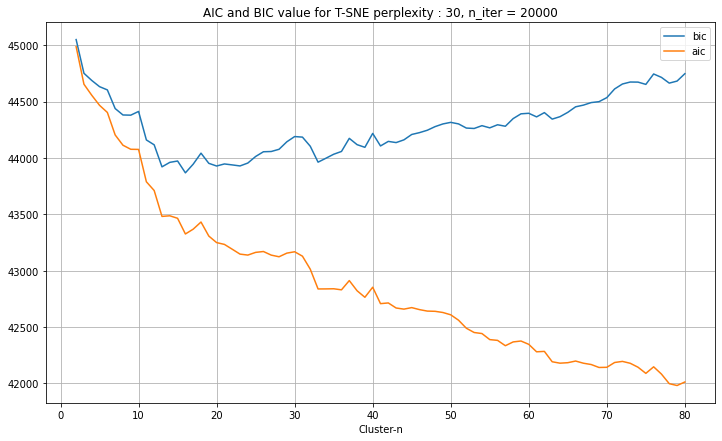

In [ ]:
n_components = np.arange(2, 81)

models = [GMM(n, covariance_type='full', random_state=13, max_iter=1000).fit(tsne_reduction_p30_iter20000) for n in n_components]

p30_iter20000=plt.plot(n_components, [m.bic(tsne_reduction_p30_iter20000) for m in models], label='bic')
p30_iter20000=plt.plot(n_components, [m.aic(tsne_reduction_p30_iter20000) for m in models], label='aic')

plt.legend(loc='best')
plt.xlabel('Cluster-n');
plt.title('AIC and BIC value for T-SNE perplexity : 30, n_iter = 20000')
plt.grid()
plt.show()

*Optimal in $k \approx 16$ (base on BIC)*

#### *__AIC and BIC in GMM:  $k \in [2,10]$ dengan T-SNE perplexity=30 dan n_iter=20000__*

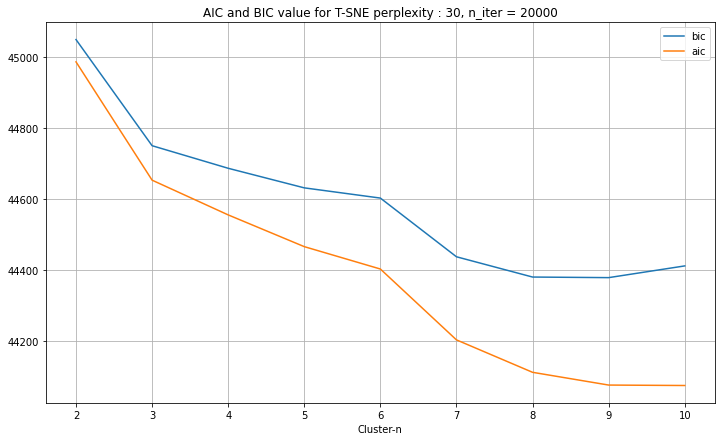

In [ ]:
n_components = np.arange(2, 11)

models = [GMM(n, covariance_type='full', random_state=13, max_iter=1000).fit(tsne_reduction_p30_iter20000) for n in n_components]

p30_iter20000=plt.plot(n_components, [m.bic(tsne_reduction_p30_iter20000) for m in models], label='bic')
p30_iter20000=plt.plot(n_components, [m.aic(tsne_reduction_p30_iter20000) for m in models], label='aic')

plt.legend(loc='best')
plt.xlabel('Cluster-n');
plt.title('AIC and BIC value for T-SNE perplexity : 30, n_iter = 20000')
plt.grid()
plt.show()

*Optimal in $k \approx 9$ (if $k >10$ were ignored)*

#### _BIC and AIC plotting using **tsne_reduction_outertruncated**_ 

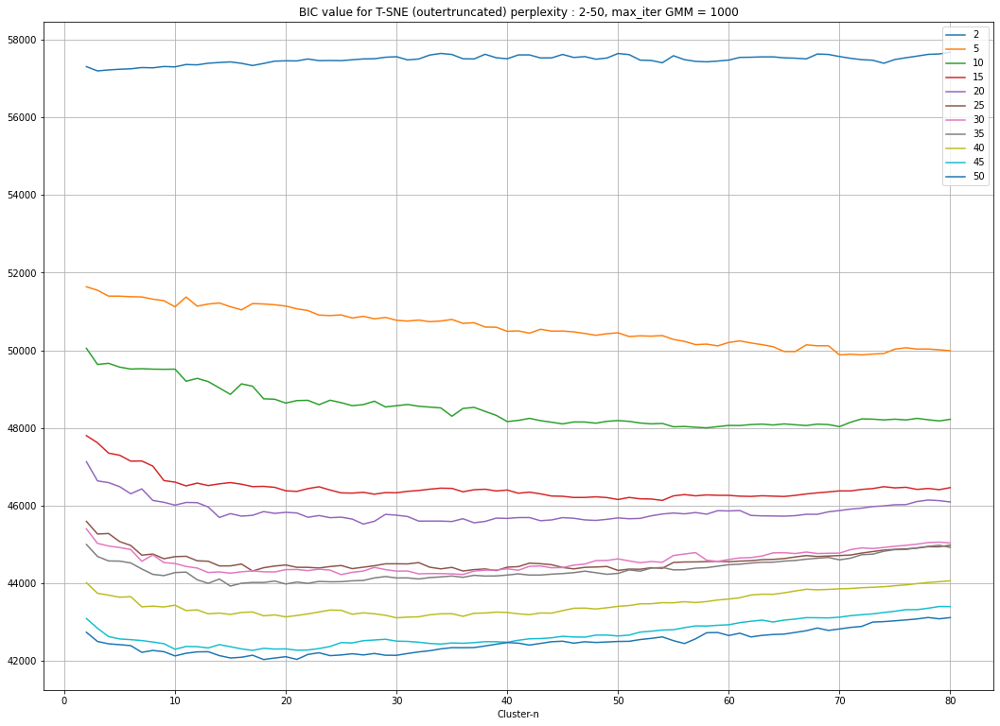

In [ ]:
idx=1
p = 2
plt.figure(figsize=(18,13))
for perplexity_p in range (2,51) :
  if (p == 2 or p%5 == 0):
    path='/content/gdrive/My Drive/dataset/pengenalan_pola/tugas4/tsne_reduction_outertruncated-p'+str(perplexity_p)+'.csv'
    plot_tsne_reduction_outertruncated = pd.read_csv(path, index_col=0)

    n_components = np.arange(2, 81)

    models = [GMM(n, covariance_type='full', random_state=13, max_iter=1000).fit(plot_tsne_reduction_outertruncated) for n in n_components]

    outertruncated=plt.plot(n_components, [m.bic(plot_tsne_reduction_outertruncated) for m in models], label=str(p))
    # outertruncated=plt.plot(n_components, [m.aic(plot_tsne_reduction_outertruncated) for m in models], label='aic')

  p+=1
plt.legend(loc='best')
plt.xlabel('Cluster-n');
plt.title('BIC value for T-SNE (outertruncated) perplexity : 2-50, max_iter GMM = 1000')
plt.grid()
plt.show()

*Optimal in $k \approx 18$ (base on BIC) with T-SNE perplexity=50 and n_iter=20000*

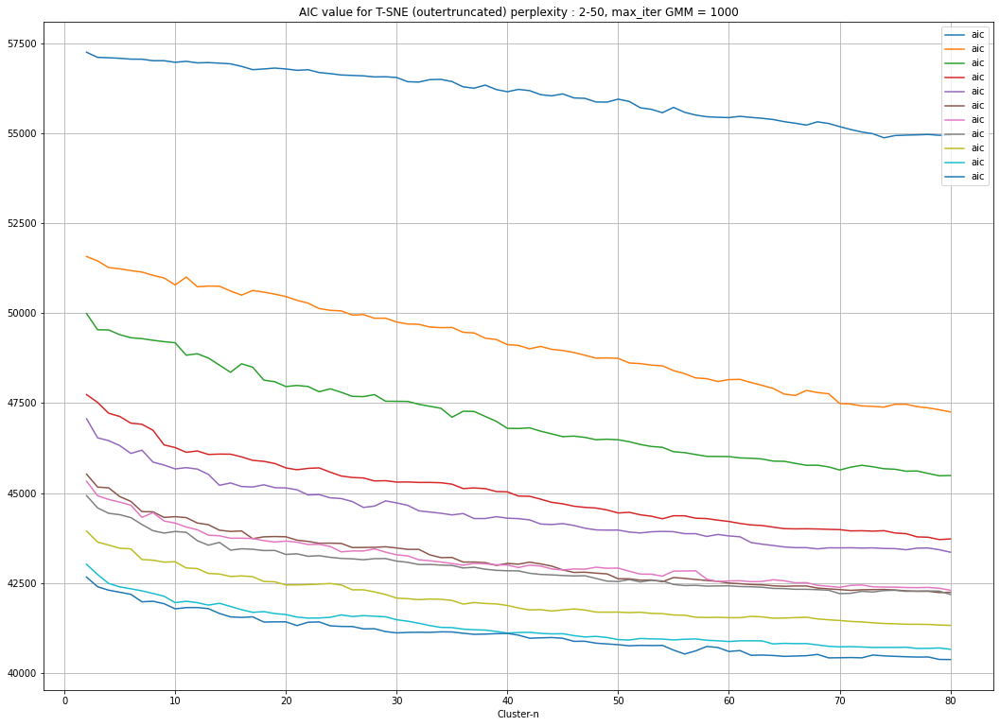

In [ ]:
idx=1
p = 2
plt.figure(figsize=(18,13))
for perplexity_p in range (2,51):
  if (p == 2 or p%5 == 0):
    path='/content/gdrive/My Drive/dataset/pengenalan_pola/tugas4/tsne_reduction_outertruncated-p'+str(perplexity_p)+'.csv'
    plot_tsne_reduction_outertruncated = pd.read_csv(path, index_col=0)

    n_components = np.arange(2, 81)

    models = [GMM(n, covariance_type='full', random_state=13, max_iter=1000).fit(plot_tsne_reduction_outertruncated) for n in n_components]

    # outertruncated=plt.plot(n_components, [m.bic(plot_tsne_reduction_outertruncated) for m in models], label=str(p))
    outertruncated=plt.plot(n_components, [m.aic(plot_tsne_reduction_outertruncated) for m in models], label='aic')

  p+=1
plt.legend(loc='best')
plt.xlabel('Cluster-n');
plt.title('AIC value for T-SNE (outertruncated) perplexity : 2-50, max_iter GMM = 1000')
plt.grid()
plt.show()

*Value AIC constantly decrease, back to BIC as reference*

#### _BIC and AIC plotting using **tsne_reduction_innertruncated**_

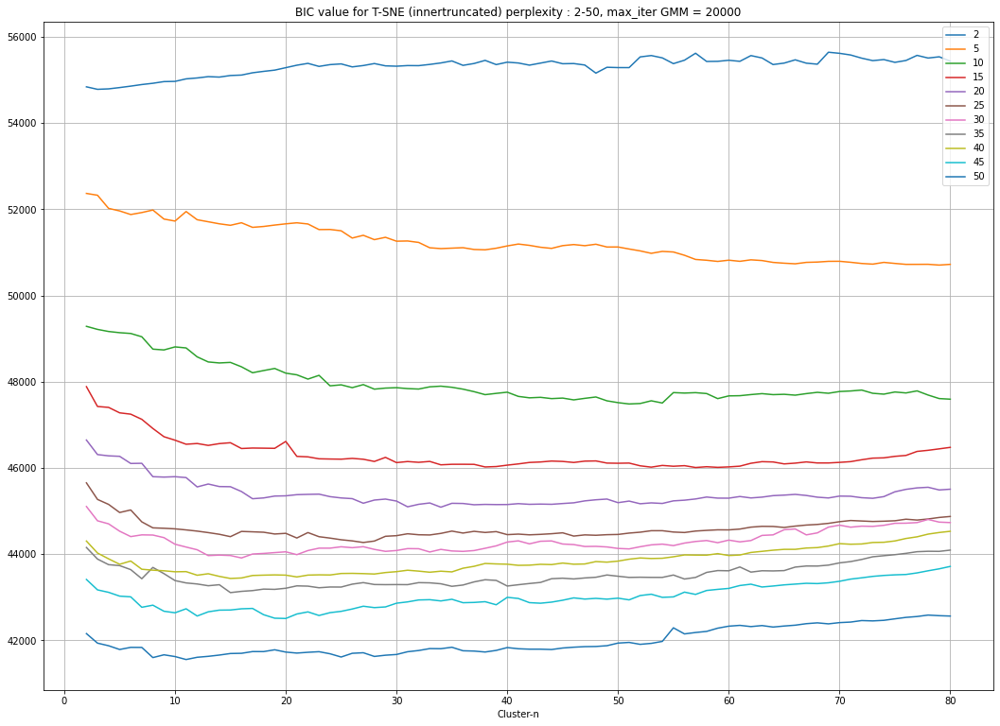

In [ ]:
idx=1
p = 2
plt.figure(figsize=(18,13))
for perplexity_p in range (2,51):
  if (p == 2 or p%5 == 0):
    path='/content/gdrive/My Drive/dataset/pengenalan_pola/tugas4/tsne_reduction_innertruncated-p'+str(perplexity_p)+'.csv'
    plot_tsne_reduction_innertruncated = pd.read_csv(path, index_col=0)

    n_components = np.arange(2, 81)

    models = [GMM(n, covariance_type='full', random_state=13, max_iter=20000).fit(plot_tsne_reduction_innertruncated) for n in n_components]

    innertruncated=plt.plot(n_components, [m.bic(plot_tsne_reduction_innertruncated) for m in models], label=str(p))
    # innertruncated=plt.plot(n_components, [m.aic(plot_tsne_reduction_innertruncated) for m in models], label='aic')

  p+=1
plt.legend(loc='best')
plt.xlabel('Cluster-n');
plt.title('BIC value for T-SNE (innertruncated) perplexity : 2-50, max_iter GMM = 20000')
plt.grid()
plt.show()

*Optimal in $k \approx 11$ (base on BIC) with T-SNE perplexity=50 and n_iter=20000*

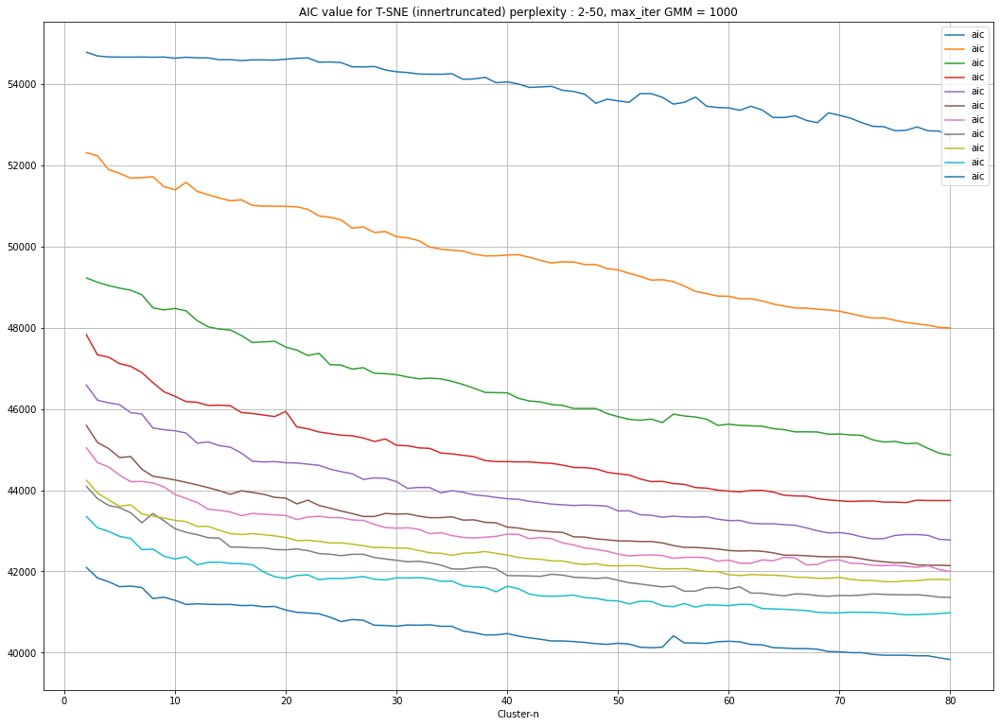

In [ ]:
idx=1
p = 2
plt.figure(figsize=(18,13))
for perplexity_p in range (2,51):
  if (p == 2 or p%5 == 0):
    path='/content/gdrive/My Drive/dataset/pengenalan_pola/tugas4/tsne_reduction_innertruncated-p'+str(perplexity_p)+'.csv'
    plot_tsne_reduction_innertruncated = pd.read_csv(path, index_col=0)

    n_components = np.arange(2, 81)

    models = [GMM(n, covariance_type='full', random_state=13, max_iter=1000).fit(plot_tsne_reduction_innertruncated) for n in n_components]

    # innertruncated=plt.plot(n_components, [m.bic(plot_tsne_reduction_innertruncated) for m in models], label=str(p))
    innertruncated=plt.plot(n_components, [m.aic(plot_tsne_reduction_innertruncated) for m in models], label='aic')

  p+=1
plt.legend(loc='best')
plt.xlabel('Cluster-n');
plt.title('AIC value for T-SNE (innertruncated) perplexity : 2-50, max_iter GMM = 1000')
plt.grid()
plt.show()

*Value AIC constantly decrease, back to BIC as reference*

### _**GaussianMixture Clustering**_

Berdasarkan analisa AIC dan BIC, diperoleh beberapa rekomendasi nilai $k$ antara lain $k=[5,6,18,11]$. Pada bagian ini saya akan melakukan visualisasi Clustering menggunakan nilai $k$ yang sudah didapat.<br><br>

---
_Based on the analysis of AIC and BIC, several recommendations for the values of $k$ are obtained. Those were $k = [16,18,11]$. I will visualize each Cluster using given the $k$._

https://stackoverflow.com/questions/47412749/how-can-i-get-a-representative-point-of-a-gmm-cluster

#### *Without T-SNE ($k = 5$)*

In [ ]:
gmm_notsne = GMM(n_components=5, random_state=13, max_iter=1000).fit(truncated_matrix1)
print(gmm_notsne.converged_)
y_gmm_notsne = gmm_notsne.predict(truncated_matrix1)

True


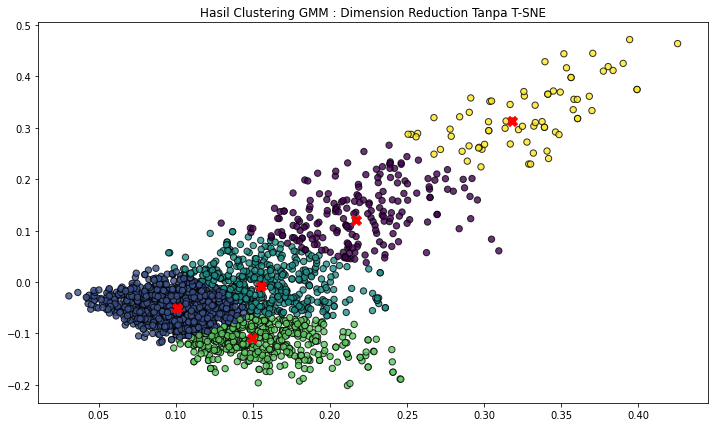

In [ ]:
import scipy.stats

plt.scatter(truncated_matrix1[:, 0], truncated_matrix1[:, 1], c=y_gmm_notsne, s=40, alpha=0.8, edgecolors='black')

centers = np.empty(shape=(gmm_notsne.n_components, truncated_matrix1.shape[1]))
for i in range(gmm_notsne.n_components):
    density = scipy.stats.multivariate_normal(cov=gmm_notsne.covariances_[i], mean=gmm_notsne.means_[i]).logpdf(truncated_matrix1)
    centers[i, :] = truncated_matrix1[np.argmax(density)]

plt.scatter(centers[:, 0], centers[:, 1], c='red', s=100, marker="X")

plt.title("Hasil Clustering GMM : Dimension Reduction Tanpa T-SNE")
plt.show()

#### *With T-SNE perplexity=30 and n_iter=20000 ($k=16$)*

In [ ]:
gmm_np30_iter20000 = GMM(n_components=16, random_state=13, max_iter=1000).fit(tsne_reduction_p30_iter20000)
print(gmm_np30_iter20000.converged_)
y_gmm_np30_iter20000 = gmm_np30_iter20000.predict(tsne_reduction_p30_iter20000)

True


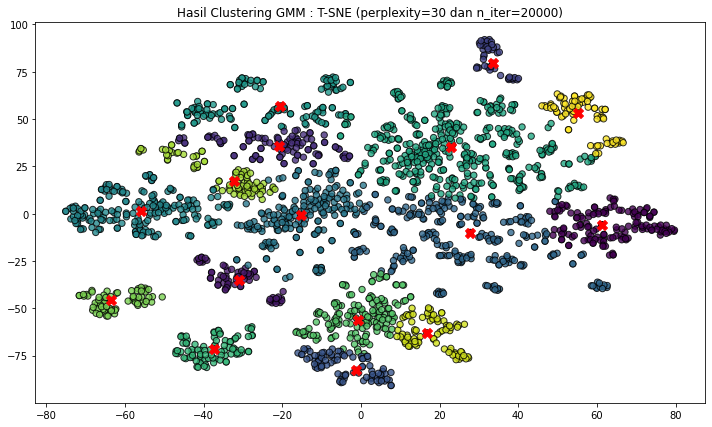

In [ ]:
import scipy.stats

plt.scatter(tsne_reduction_p30_iter20000[:, 0], tsne_reduction_p30_iter20000[:, 1], c=y_gmm_np30_iter20000, s=40, alpha=0.8, edgecolors='black')

centers = np.empty(shape=(gmm_np30_iter20000.n_components, tsne_reduction_p30_iter20000.shape[1]))
for i in range(gmm_np30_iter20000.n_components):
    density = scipy.stats.multivariate_normal(cov=gmm_np30_iter20000.covariances_[i], mean=gmm_np30_iter20000.means_[i]).logpdf(tsne_reduction_p30_iter20000)
    centers[i, :] = tsne_reduction_p30_iter20000[np.argmax(density)]

plt.scatter(centers[:, 0], centers[:, 1], c='red', s=100, marker="X")

plt.title("Hasil Clustering GMM : T-SNE (perplexity=30 dan n_iter=20000)")
plt.show()

#### *With T-SNE (outertruncated) perplexity=50 and n_iter=20000 ($k=18$)*

In [ ]:
path='/content/gdrive/My Drive/dataset/pengenalan_pola/tugas4/tsne_reduction_outertruncated-p50.csv'
tsne_reduction_outertruncated50 = pd.read_csv(path, index_col=0)

gmm_outertruncated = GMM(n_components=18, random_state=13, max_iter=1000).fit(tsne_reduction_outertruncated50)
print(gmm_outertruncated.converged_)
y_gmm_outertruncated = gmm_outertruncated.predict(tsne_reduction_outertruncated50)

True


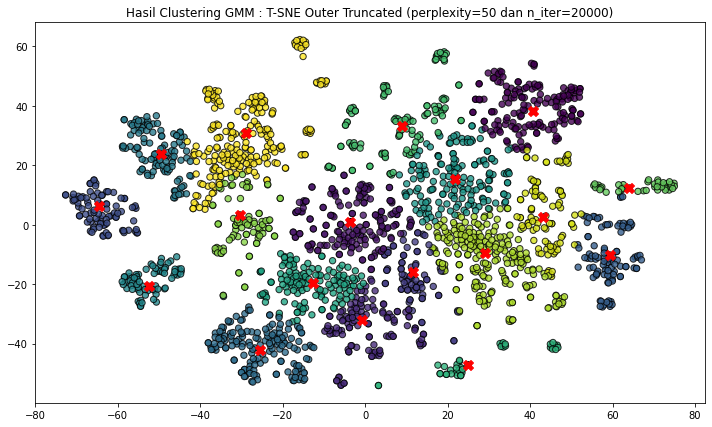

In [ ]:
import scipy.stats

plt.scatter(tsne_reduction_outertruncated50.iloc[:, 0], tsne_reduction_outertruncated50.iloc[:, 1], c=y_gmm_outertruncated, s=40, alpha=0.8, edgecolors='black')

centers = np.empty(shape=(gmm_outertruncated.n_components, tsne_reduction_outertruncated50.shape[1]))
for i in range(gmm_outertruncated.n_components):
    density = scipy.stats.multivariate_normal(cov=gmm_outertruncated.covariances_[i], mean=gmm_outertruncated.means_[i]).logpdf(tsne_reduction_outertruncated50)
    centers[i, :] = tsne_reduction_outertruncated50.iloc[np.argmax(density)]

plt.scatter(centers[:, 0], centers[:, 1], c='red', s=100, marker="X")

plt.title("Hasil Clustering GMM : T-SNE Outer Truncated (perplexity=50 dan n_iter=20000)")
plt.show()

#### *With T-SNE (innertruncated) perplexity=50 and n_iter=20000 ($k=11$)*

In [ ]:
path='/content/gdrive/My Drive/dataset/pengenalan_pola/tugas4/tsne_reduction_innertruncated-p50.csv'
tsne_reduction_innertruncated50 = pd.read_csv(path, index_col=0)

gmm_innertruncated = GMM(n_components=11, random_state=13, max_iter=1000).fit(tsne_reduction_innertruncated50)
print(gmm_innertruncated.converged_)
y_gmm_innertruncated = gmm_innertruncated.predict(tsne_reduction_innertruncated50)

True


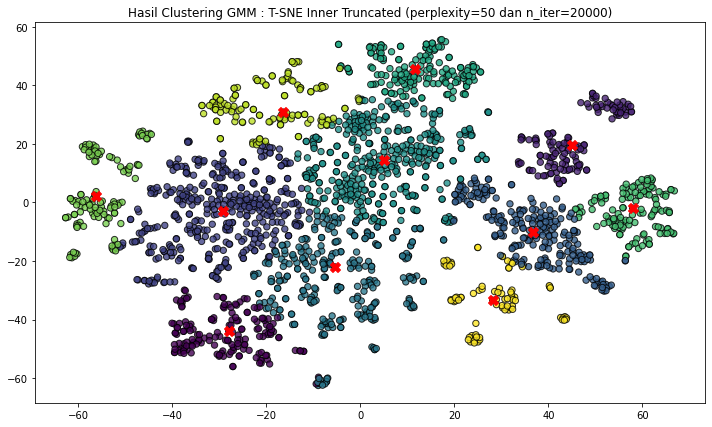

In [ ]:
import scipy.stats

plt.scatter(tsne_reduction_innertruncated50.iloc[:, 0], tsne_reduction_innertruncated50.iloc[:, 1], c=y_gmm_innertruncated, s=40, alpha=0.8, edgecolors='black')

centers = np.empty(shape=(gmm_innertruncated.n_components, tsne_reduction_innertruncated50.shape[1]))
for i in range(gmm_innertruncated.n_components):
    density = scipy.stats.multivariate_normal(cov=gmm_innertruncated.covariances_[i], mean=gmm_innertruncated.means_[i]).logpdf(tsne_reduction_innertruncated50)
    centers[i, :] = tsne_reduction_innertruncated50.iloc[np.argmax(density)]

plt.scatter(centers[:, 0], centers[:, 1], c='red', s=100, marker="X")

plt.title("Hasil Clustering GMM : T-SNE Inner Truncated (perplexity=50 dan n_iter=20000)")
plt.show()

### _**Deeper Analysis**_

Untuk analisa lebih dalam, saya menggunakan hasil dari "GMM Clustering With T-SNE perplexity=30 and n_iter=20000 ( k=16 )" yang sebelumnya telah diperoleh.<br><br>

---
_For further analysis, I use the result "GMM Clustering With T-SNE perplexity=30 and n_iter=20000 ( k=16 )"._

#### **_Predicted Topic vs actual Topic_**

Saya akan mengambil 1 artikel dari tiap topik hasil prediksi (model memprediksi 16 topik berbeda yang dituliskan dengan index angka) dan kemudian membandingkannya dengan label sebenarnya.<br><br>

---
_I will take 1 article from each prediction topic (the model predicts 16 different topics written represent with index number) and then compares it to the actual label._

In [ ]:
flag =[]
dict_docpercluster ={}
docnum = 0
for prediction in (y_gmm_np30_iter20000):
  if(not(prediction in flag)):
    # print(docnum)
    dict_docpercluster.update({prediction:docnum})
    flag.append(prediction)
  if(len(flag)==16):
    break;
  else:
    docnum+=1


In [ ]:
prediction=[]
for key in dict_docpercluster:
  prediction.append(key)

text=[]
ori_class=[]
for i in range(len(dict_docpercluster)):
  extracted_data=dict_docpercluster[i]
  text.append(newdf.iloc[extracted_data]['text'])
  ori_class.append(newdf.iloc[extracted_data]['y'])

df_display_text =pd.DataFrame({
    'predicted_cluster':prediction,'text':text,'original_label':ori_class
})
	
pd.set_option('display.max_colwidth', -1)
display(df_display_text)
display(df_display_text['original_label'].value_counts())

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  app.launch_new_instance()


predicted_cluster  ... original_label
0   13                 ...  business     
1   7                  ...  tech         
2   9                  ...  tech         
3   6                  ...  business     
4   5                  ...  sport        
5   12                 ...  entertainment
6   8                  ...  entertainment
7   2                  ...  entertainment
8   1                  ...  tech         
9   11                 ...  entertainment
10  4                  ...  sport        
11  10                 ...  sport        
12  14                 ...  entertainment
13  3                  ...  entertainment
14  15                 ...  sport        
15  0                  ...  business     

[16 rows x 3 columns]

entertainment    6
sport            4
tech             3
business         3
Name: original_label, dtype: int64

Hasil prediksi terbaik berdasarkan nilai BIC yang sebelumnya diperoleh, data dapat dikelompokan menjadi 16 clusters berbeda. Dengan mengambil 1 dokumen pertama dari masing-masing cluster, diperoleh hasil bahwa __ada beberapa dokumen dengan cluster berbeda memiliki original label yang sama__ (seperti contoh, dari 16 dokumen dari masing-masing cluster, 6 diantaranya memiliki label original 'entertainment')<br><br>

---
_The best prediction results are based on the previously obtained BIC values, the data can be grouped into 16 different clusters. By taking the first 1 document from each cluster, it shows that several documents with different clusters that have the identical original label (for example, 6 out of 16 documents from each cluster have the original 'entertainment' label)_

#### _**Analysis base on specific "region"**_

Saya akan menampilkan probabilitas prediksi Cluster untuk data dengan $x_2 < -60$.<br><br>

---
_I will display the probality of Cluster prediction for data in range $x_2 < -60$._

In [ ]:
x1=np.ones((1, len(tsne_reduction_p30_iter20000)), dtype=bool)
x2=(tsne_reduction_p30_iter20000[:,1]<-60)
x12 = np.vstack((x1, x2)).T
filtered_extreme=np.all(x12 == True, axis=1)

idx_filtered_extreme = []
idx=0
for i in filtered_extreme:
  if (i==True):
    idx_filtered_extreme.append(idx)
  idx+=1

16


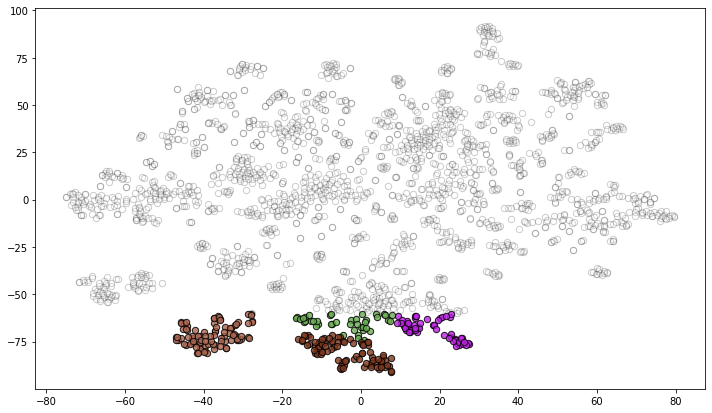

In [ ]:
color_selector=['#edb879','#1979a9','#e07b39','#69bdd2','#80391e','#cce7e8','#1c100b','#042f66','#b87455','#44bcd8','#AC6650','#68AC50','#E82038','#E84720','#C120E8','#26AD21']
print(len(color_selector))
filter_plt = plt.scatter(tsne_reduction_p30_iter20000[:, 0], tsne_reduction_p30_iter20000[:, 1],c='white', s=40, alpha=0.2, edgecolors='black')
for i in idx_filtered_extreme:
  filter_plt = plt.scatter(tsne_reduction_p30_iter20000[i, 0], tsne_reduction_p30_iter20000[i, 1],c=color_selector[y_gmm_np30_iter20000[i]], s=40, alpha=0.8, edgecolors='black')

In [ ]:
def color_b4060_orange(val):
    color = 'orange' if val < 0.6 and val > 0.4 else 'default'
    return 'color: %s' % color

def high_prob(val):
    color = 'green' if val > 0.9 else 'default'
    return 'color: %s' % color

In [ ]:
probs = gmm_np30_iter20000.predict_proba(tsne_reduction_p30_iter20000)
df_gmmprob = pd.DataFrame(probs)
df_gmmprob=df_gmmprob.iloc[idx_filtered_extreme]

with pd.option_context('display.precision', 2):
    df_gmmprob_newformat = (df_gmmprob.style.format('{:.2%}')
                            .applymap(color_b4060_orange)
                            .applymap(high_prob))
df_gmmprob_newformat

Teks berwarna __hijau berarti data point tersebut memiliki probabilitas besar (>90%) merupakan anggota dari cluster yang diprediksi__. Warna hijau hampir terlihat disemua datapoint dikarenakan __jumlah cluster yang diimplementasikan cukup tinggi (k=16) sehingga jarak dari tiap datapoint extreme ini menuju centroidnya relatif dekat__.<br><br>

Dibeberapa datapoint memiliki probabilitas antara 40% hingga 60% menunjukan kecenderungannya terhadap 2 cluster yang berbeda. Dengan begitu kita dapat menyimpulkan bahwa __tiap datapoint dapat dimasukan kedalam SALAH SATU cluster saja, tetapi tidak akan serta-merta menghilangkan karakteristik cluster lain yang terkandung didalam datapoint tersebut__ sehingga tetap ada probabilitas data tersebut milik cluster lain (kecuali jika ternyata ada data yang memiliki probabilitas 50-50, atau 20-20-20-20, atau sejenisnya, maka data tersebut tidak dapat dimasukan hanya kedalam satu cluster aja/data tanpa cluster). Alasan ini juga yang menjadi dasar pada analisa sebelumnya dimana beberapa artikel dengan prediksi berbeda ternyata memiliki label original yang sama.<br><br>

---
_Green text means that each data point has a high probability (> 90%) of being a member of the predicted cluster. The green color is almost visible in all datapoints because the number of clusters implemented is relatively high (k = 16) so that the distance from each extreme data point to the centroid is relatively close._

Some data points have a probability between 40% and 60% showing a tendency towards 2 different clusters. Therefore, we can conclude that each data point can be classified as ONE cluster only, but it will not immediately eliminate the characteristics of the other clusters contained in the datapoint so that there is still a probability that the data belongs to another cluster (unless it turns out that there is data that has a probability of 50. -50, or 20-20-20-20, or the like, then the data cannot be entered into only one cluster/data without cluster). This reason is also the basis for the previous analysis where several articles with different predictions turned out to have the same original label.

### _**Additional Analysis**_

Lakukan eksplorasi tambahan dari apa yang sudah Anda dapatkan sejauh ini. Beberapa hal yang bisa Anda coba:

- Mencoba clustering tanpa menghilangkan *stopwords*
- Mengganti random seed dan melihat perbedaan hasil clustering
- Mencoba nilai $k$ yang berbeda
- Mencoba mengeluarkan "akurasi" dari prediksi dengan GMM maupun k-Means
- Mengeksplorasi pustaka [Altair](https://altair-viz.github.io/) untuk visualisasi yang lebih interaktif

#### Altair Visualization

In [ ]:
import altair as alt

In [ ]:
original_data = pd.DataFrame(tsne_reduction_p30_iter20000)
original_data['label']=newdf['y']
# original_data
original_data.rename(columns={0:'x1',
                              1:'x2'},
                              inplace=True)

alt.Chart(original_data).mark_point().encode(
    alt.X('x1'),
    alt.Y('x2'),
    alt.Color('label'),
    alt.OpacityValue(0.6),
    tooltip=[alt.Tooltip('x1'),
             alt.Tooltip('x2'),
             alt.Tooltip('label')
             ]
).properties(
    width=900,
    height=500
).interactive()

alt.Chart(...)

#### Try to find extreme point for AIC

Saya mencoba untuk memperbesar range n_component hingga 200 ($k=200$) untuk melihat apakah AIC akan mencapai minimum extreme point dan kembali ke atas atau mencapai perilaku gradien/kemiringan yang konvergen atau menghasilkan perilaku lainnya :<br><br>

---
_I am trying to increase the n_component range to 200 ($k=200$) to see if the AIC will reach the minimum extreme point and go back up or achieve gradient/slope behavior that converges or results in some other behavior:_

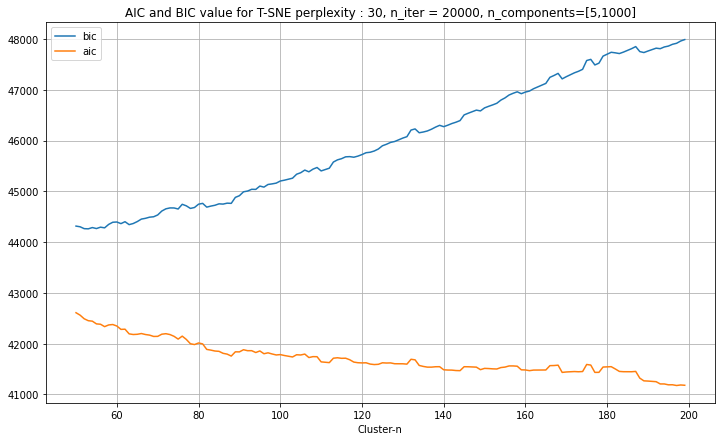

In [ ]:
n_components = np.arange(50, 200)

models = [GMM(n, covariance_type='full', random_state=13, max_iter=1000).fit(tsne_reduction_p30_iter20000) for n in n_components]

bic_gmm_n1000 = []
aic_gmm_n1000 = []
for m in models:
  bic_gmm_n1000.append(m.bic(tsne_reduction_p30_iter20000))
  aic_gmm_n1000.append(m.aic(tsne_reduction_p30_iter20000))

p30_iter20000=plt.plot(n_components, bic_gmm_n1000, label='bic')
p30_iter20000=plt.plot(n_components, aic_gmm_n1000, label='aic')

plt.legend(loc='best')
plt.xlabel('Cluster-n');
plt.title('AIC and BIC value for T-SNE perplexity : 30, n_iter = 20000, n_components=[5,1000]')
plt.grid()
plt.show()

*hingga k=200, AIC masih belum menemukan titik extreme minimum maupun mencapai kondisi konvergen.*<br><br>

*Menurut referensi https://machinelearningmastery.com/probabilistic-model-selection-measures/ AIC memiliki kecenderungan untuk memberikan __penalti lebih kecil__ dibandingkan dengan BIC, sehingga efeknya terkesan lebih "tolerir" terhadap model yang kompleks. Dalam kasus ini, AIC dengan value terendah didapat dengan menerapkan $k =$ $dimensi$ $data$, yang berarti masih overfitting terjadi karena tiap atribut memiliki clusternya masing-masing. Sebaliknya, BIC lebih cenderung untuk memberikan __penalti lebih besar seiring semakin kompleksnya sebuah model__, terlihat bahwa pada $k=2$ (di analisa sebelumnya) memiliki $BIC \approx 45000$. Titik terendah pada $k=16$ memiliki $BIC \approx 43800$. Selepas dari titik itu, nilai BIC selalu naik bahkan hingga $k=200$ memiliki $BIC \approx 48000$*<br><br>

---
_Up to k = 200 AIC still has not found an extreme minimum point or reached a convergent condition._

_According to the reference https://machinelearningmastery.com/probabilistic-model-selection-measures/, AIC tends to provide smaller penalties than BIC, as result AIC tends to be more "tolerant" of complex models. In this case, the AIC with the lowest value is obtained by applying $k =$ $dimension$ $data$, which means that there is still overfitting because each attribute has its cluster. On the other hand, BIC is more likely to give a bigger penalty because the model becomes more complex. As shown at $k=2$ (in the previous analysis) the model has BIC≈45000. The lowest point at $k=16$ has $BIC \approx 43800$. After that, the BIC value always goes up, even until $k=200$ has $BIC \approx 48000$_

#### _**"Accuration"** analysis using Confusion Matrix_

##### K-Means 5 Cluster

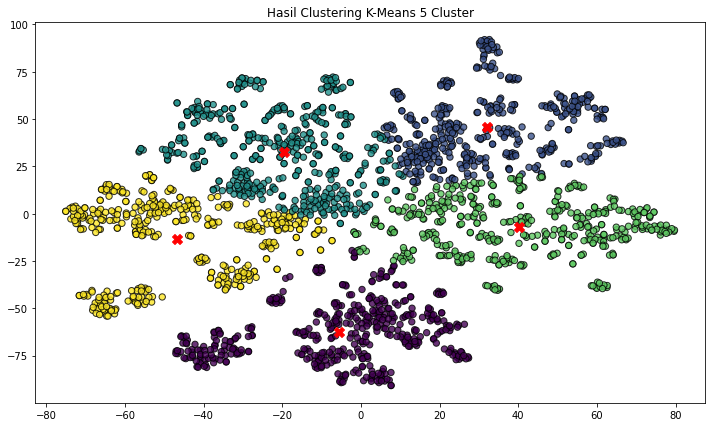

In [ ]:
kmeans_5cluster = KMeans(n_clusters=5, random_state=13).fit(tsne_reduction_p30_iter20000)
y_kmeans_5cluster = kmeans_5cluster.predict(tsne_reduction_p30_iter20000)

plt.scatter(tsne_reduction_p30_iter20000[:, 0], tsne_reduction_p30_iter20000[:, 1], c=y_kmeans_5cluster, s=40, alpha=0.8, edgecolors='black')

centers = kmeans_5cluster.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=100, marker="X")

plt.title("Hasil Clustering K-Means 5 Cluster")
plt.show()

In [ ]:
original_kmeans5cluster = original_data
original_kmeans5cluster['prediction'] = y_kmeans_5cluster

original_kmeans5cluster.rename(columns={'label':'original_label'}, inplace=True)

print("Hasil Clustering K-Means 5 Cluster terhadap Original Data")
alt.Chart(original_kmeans5cluster).mark_point().encode(
    alt.X('x1'),
    alt.Y('x2'),
    alt.Color('prediction', scale=alt.Scale(scheme='tableau20')),
    alt.Shape('original_label'),
    alt.OpacityValue(0.6),
    tooltip=[alt.Tooltip('x1'),
             alt.Tooltip('x2'),
             alt.Tooltip('prediction'),
             alt.Tooltip('original_label')
             ]
).properties(
    width=900,
    height=500
).interactive()

Hasil Clustering K-Means 5 Cluster terhadap Original Data


alt.Chart(...)

In [ ]:
from scipy import stats

dominant_incluster =[]
for i in range (5):
  the_y = y_kmeans_5cluster[start[i]:(end[i]+1)]
  dominant_incluster.append(stats.mode(the_y))
print(dominant_incluster)

mapping_label_cluster ={0:[newdf.iloc[start[0],1],int(dominant_incluster[0][0])], 
                        1:[newdf.iloc[start[1],1],int(dominant_incluster[1][0])], 
                        2:[newdf.iloc[start[2],1],int(dominant_incluster[2][0])], 
                        3:[newdf.iloc[start[3],1],int(dominant_incluster[3][0])], 
                        4:[newdf.iloc[start[4],1],int(dominant_incluster[4][0])]}
print('------------------')
display(mapping_label_cluster)

[ModeResult(mode=array([4], dtype=int32), count=array([258])), ModeResult(mode=array([2], dtype=int32), count=array([312])), ModeResult(mode=array([0], dtype=int32), count=array([442])), ModeResult(mode=array([1], dtype=int32), count=array([414])), ModeResult(mode=array([3], dtype=int32), count=array([394]))]
------------------


{0: ['entertainment', 4],
 1: ['tech', 2],
 2: ['sport', 0],
 3: ['business', 1],
 4: ['politics', 3]}

dari sini kita tahu bahwa untuk K-Means:

__{0: ['entertainment', <'cluster prediksi'>],<br>
1: ['tech', <'mapping cluster prediksi'>],<br>
2: ['sport', <'mapping cluster prediksi'>],<br>
3: ['business', <'mapping cluster prediksi'>],<br>
4: ['politics', <'mapping cluster prediksi'>]}__

bila **y_predict** dianggap sebagai value yang merepresentasikan **true_value** dari masing-masing cluster, maka dapat dibuat __Confusion Matrix__ sebagai berikut :<br><br>

---
_From code above for K-Means, we know that:_

_**{0: ['entertainment', <'cluster prediksi'>],<br>
1: ['tech', <'mapped prediction cluster'>],<br>
2: ['sport', <'mapped prediction cluster'>],<br>
3: ['business', <'mapped prediction cluster'>],<br>
4: ['politics', <'mapped prediction cluster'>]}**_

_if **y_predict** considered as a value that represents **true_value** from each cluster, so we can make __Confusion Matrix__ as follows :_

Text(0.5, 1.0, 'Confusion Matrix : K-Means 5 Cluster')

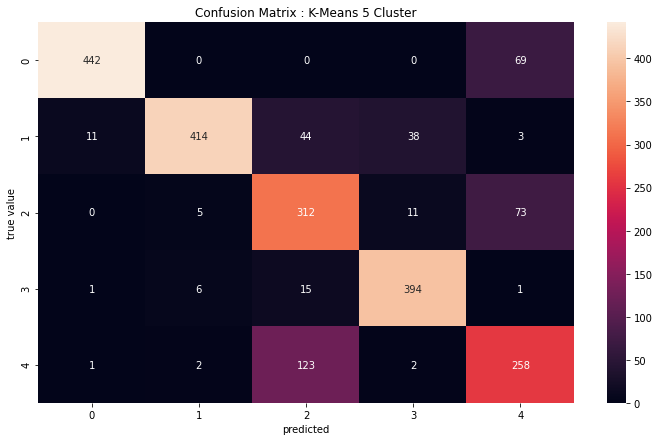

In [ ]:
y_true=[]

for i in range(5):
  for j in range(start[i],end[i]+1):
    y_true.append(mapping_label_cluster.get(i)[1])

# len(y_gmm_5cluster)

cfm=confusion_matrix(y_true, y_kmeans_5cluster)

sns.heatmap(cfm,annot=True, fmt="d")
plt.xlabel('predicted')
plt.ylabel('true value')
plt.title('Confusion Matrix : K-Means 5 Cluster')

##### GMM 5 cluster

True


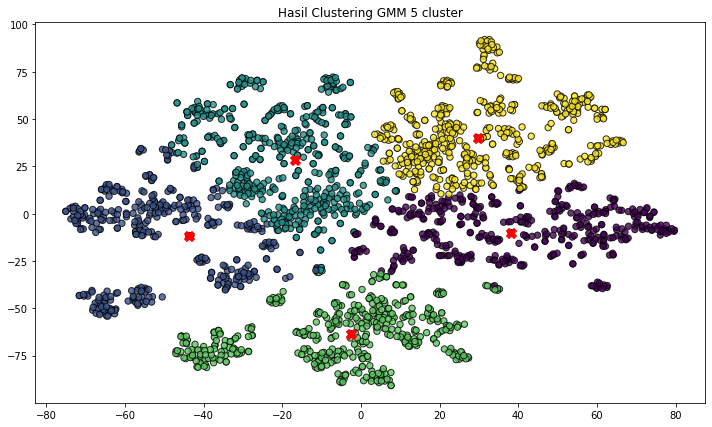

In [ ]:
gmm_5cluster = GMM(n_components=5, random_state=13, max_iter=1000).fit(tsne_reduction_p30_iter20000)
print(gmm_5cluster.converged_)
y_gmm_5cluster = gmm_5cluster.predict(tsne_reduction_p30_iter20000)

plt.scatter(tsne_reduction_p30_iter20000[:, 0], tsne_reduction_p30_iter20000[:, 1], c=y_gmm_5cluster, s=40, alpha=0.8, edgecolors='black')

centers = np.empty(shape=(gmm_5cluster.n_components, tsne_reduction_p30_iter20000.shape[1]))
for i in range(gmm_5cluster.n_components):
    density = scipy.stats.multivariate_normal(cov=gmm_5cluster.covariances_[i], mean=gmm_5cluster.means_[i]).logpdf(tsne_reduction_p30_iter20000)
    centers[i, :] = tsne_reduction_p30_iter20000[np.argmax(density)]

plt.scatter(centers[:, 0], centers[:, 1], c='red', s=100, marker="X")

plt.title("Hasil Clustering GMM 5 cluster")
plt.show()

In [ ]:
original_gmm5cluster = original_data
original_gmm5cluster['prediction'] = y_gmm_5cluster
# original_gmm5cluster

original_gmm5cluster.rename(columns={'label':'original_label'}, inplace=True)

print("Hasil Clustering GMM 5 cluster, terhadap Original Data")
alt.Chart(original_gmm5cluster).mark_point().encode(
    alt.X('x1'),
    alt.Y('x2'),
    alt.Color('prediction', scale=alt.Scale(scheme='tableau20')),
    alt.Shape('original_label'),
    # alt.ColorScheme('tableau20'),
    alt.OpacityValue(0.6),
    tooltip=[alt.Tooltip('x1'),
             alt.Tooltip('x2'),
             alt.Tooltip('prediction'),
             alt.Tooltip('original_label')
             ]
).properties(
    width=900,
    height=500
).interactive()

Hasil Clustering GMM 5 cluster, terhadap Original Data


alt.Chart(...)

In [ ]:
from scipy import stats

dominant_incluster =[]
for i in range (5):
  the_y = y_gmm_5cluster[start[i]:(end[i]+1)]
  dominant_incluster.append(stats.mode(the_y))
print(dominant_incluster)

mapping_label_cluster ={0:[newdf.iloc[start[0],1],int(dominant_incluster[0][0])], 
                        1:[newdf.iloc[start[1],1],int(dominant_incluster[1][0])], 
                        2:[newdf.iloc[start[2],1],int(dominant_incluster[2][0])], 
                        3:[newdf.iloc[start[3],1],int(dominant_incluster[3][0])], 
                        4:[newdf.iloc[start[4],1],int(dominant_incluster[4][0])]}
print('------------------')
display(mapping_label_cluster)

[ModeResult(mode=array([1]), count=array([228])), ModeResult(mode=array([2]), count=array([316])), ModeResult(mode=array([3]), count=array([425])), ModeResult(mode=array([4]), count=array([447])), ModeResult(mode=array([0]), count=array([372]))]
------------------


{0: ['entertainment', 1],
 1: ['tech', 2],
 2: ['sport', 3],
 3: ['business', 4],
 4: ['politics', 0]}

dari sini kita tahu bahwa untuk GMM dipetakan menjadi dictionary diatas dengan keterangan:

__{0: ['entertainment', <'cluster prediksi'>],<br>
1: ['tech', <'cluster prediksi'>],<br>
2: ['sport', <'cluster prediksi'>],<br>
3: ['business', <'cluster prediksi'>],<br>
4: ['politics', <'cluster prediksi'>]}__

bila y_predict dianggap sebagai value yang merepresentasikan true_value dari masing-masing cluster, maka dapat dibuat __Confusion Matrix__ sebagai berikut :<br><br>

---
_From code above for GMM, we know that:_

_**{0: ['entertainment', <'cluster prediksi'>],<br>
1: ['tech', <'mapped prediction cluster'>],<br>
2: ['sport', <'mapped prediction cluster'>],<br>
3: ['business', <'mapped prediction cluster'>],<br>
4: ['politics', <'mapped prediction cluster'>]}**_

_if y_predict considered as a value that represents true_value from each cluster, so we can make Confusion Matrix as follows :_

Text(0.5, 1.0, 'Confusion Matrix : GMM 5 Cluster')

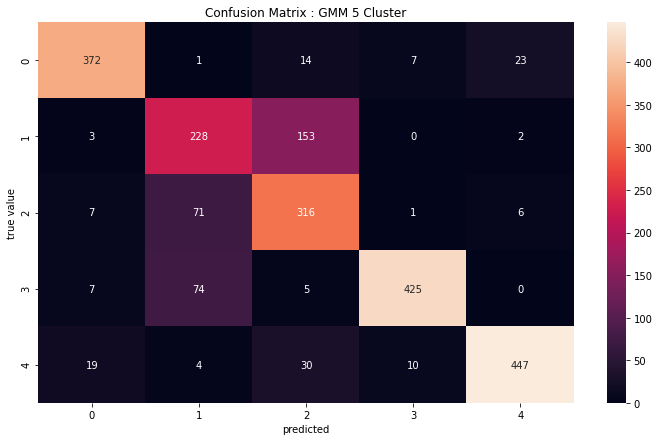

In [ ]:
y_true=[]

for i in range(5):
  for j in range(start[i],end[i]+1):
    y_true.append(mapping_label_cluster.get(i)[1])

# len(y_gmm_5cluster)

cfm=confusion_matrix(y_true, y_gmm_5cluster)

sns.heatmap(cfm,annot=True, fmt="d")
plt.xlabel('predicted')
plt.ylabel('true value')
plt.title('Confusion Matrix : GMM 5 Cluster')